In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
from io import BytesIO
from PIL import Image as PIL_Image
import numpy as np
from IPython.display import display, Image

def display_img_array(ima, **kwargs):
    if ima.dtype == np.float32 or ima.dtype == np.float64:
        ima = (np.clip(ima, 0., 1.)*255).astype(np.uint8)
    im = PIL_Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png', **kwargs))

In [3]:
import os
import urllib
from urllib.request import urlretrieve
dataset = 'mnist.pkl.gz'
def reporthook(a,b,c):
    print("\rdownloading: %5.1f%%"%(a*b*100.0/c), end="")
    
if not os.path.isfile(dataset):
        origin = "https://github.com/mnielsen/neural-networks-and-deep-learning/raw/master/data/mnist.pkl.gz"
        print('Downloading data from %s' % origin)
        urlretrieve(origin, dataset, reporthook=reporthook)

In [4]:
import gzip
import pickle
with gzip.open(dataset, 'rb') as f:
    train_set, valid_set, test_set = pickle.load(f, encoding='latin1')

In [5]:
train_set = (np.concatenate([train_set[0], valid_set[0]]),   np.concatenate([train_set[1], valid_set[1]]))

In [6]:
print("train_set", train_set[0].shape, train_set[1].shape)
print("test_set", test_set[0].shape, test_set[1].shape)

train_set (60000, 784) (60000,)
test_set (10000, 784) (10000,)


In [7]:
IMG_C, IMG_W, IMG_H=1,28,28

In [8]:
def show(x):
    x = x.reshape(-1, IMG_C, IMG_H, IMG_W)
    w = min(x.shape[0]*100, 800)
    x = x.swapaxes(0, 1).swapaxes(1,2)
    if IMG_C == 1:
        img = x.reshape(IMG_H, -1)
    else:
        x = x.reshape(IMG_C, IMG_H, -1)
        img = np.swapaxes(x, 0, 1)
        img = np.swapaxes(img, 1, 2)
    display_img_array(img, width=w)    
for i in range(3):
    show(train_set[0][i])
show(train_set[0][:10])

In [9]:
import sys
sys.setrecursionlimit(10000)

In [10]:
import numpy as np
import theano
import theano.tensor as T
import lasagne
from lasagne.layers import DenseLayer, DropoutLayer, ReshapeLayer, InputLayer, FlattenLayer, Upscale2DLayer, LocalResponseNormalization2DLayer
floatX = theano.config.floatX

Using gpu device 0: GeForce GTX 1080 (CNMeM is disabled, cuDNN 5105)


In [11]:
from lasagne.layers.dnn import MaxPool2DDNNLayer, Conv2DDNNLayer
from lasagne.layers import TransposedConv2DLayer

In [12]:
from lasagne.layers import ElemwiseSumLayer, NonlinearityLayer, GlobalPoolLayer, ConcatLayer
from lasagne.nonlinearities import rectify
from lasagne.layers import get_output
def batch_norm(x):
    return lasagne.layers.batch_norm(x, gamma=lasagne.init.Normal(1., 0.02))

In [13]:
from lasagne.objectives import categorical_crossentropy, binary_crossentropy, categorical_accuracy, binary_accuracy

In [14]:
from lasagne.nonlinearities import LeakyRectify, rectify, sigmoid, linear, softmax
lRELU = LeakyRectify(0.01)
RELU =rectify

In [15]:
def conv2d(*args, **kwargs):
    return Conv2DDNNLayer(*args, W=lasagne.init.Normal(std=0.02), **kwargs)
def deconv2d(*args, **kwargs):
    return TransposedConv2DLayer(*args, W=lasagne.init.Normal(std=0.02), **kwargs)
def dense(*args, **kwargs):
    return DenseLayer(*args, W=lasagne.init.Normal(std=0.02), **kwargs)

In [16]:
input_Y = T.matrix()  # discrete latent variable (1  10-category)
input_C = T.matrix()  # continuous latent variable 
input_Z = T.matrix()  # noise (NU gaussian)
input_X = T.matrix()  # image
target_var = T.matrix() # discriminator target

_ = InputLayer(shape=(None, IMG_C*IMG_H*IMG_W), input_var=input_X)
_ = ReshapeLayer(_, ([0], IMG_C, IMG_H, IMG_W))
_ = conv2d(_, 64, 4, stride=2, nonlinearity=lRELU, pad=1)
_ = batch_norm(conv2d(_, 128, 4, stride=2, nonlinearity=lRELU, pad=1))
_ = batch_norm(dense(_, num_units=1024, nonlinearity=lRELU))
l_discriminator = dense(_, num_units=1, nonlinearity=sigmoid)

_ = batch_norm(dense(_, num_units=128, nonlinearity=lRELU))
l_Q_Y = dense(_,  num_units=10, nonlinearity=softmax)
l_Q_C_mean = dense(_, num_units=2, nonlinearity=linear)
l_Q_C_logstddev = dense(_, num_units=2, nonlinearity=lambda x:T.maximum(x, -16))


NU = 64 # dim of noise
CU = 2 # dim of continuous latent variable
input_var2 = T.matrix()
_Y = InputLayer(shape=(None, 10), input_var=input_Y)
_C = InputLayer(shape=(None, CU), input_var=input_C)
_Z = InputLayer(shape=(None, NU), input_var=input_Z)
_ = ConcatLayer((_Y, _C, _Z))
_ = batch_norm(dense(_, num_units=1024, nonlinearity=RELU))
_ = batch_norm(dense(_, num_units=128*(IMG_H//4)*(IMG_W//4), nonlinearity=RELU))
_ = ReshapeLayer(_, ([0], 128, IMG_H//4, IMG_W//4))
_ = batch_norm(deconv2d(_, 64, 4, stride=2, nonlinearity=RELU, crop=1))
_ = batch_norm(deconv2d(_, 1, 4, stride=2, nonlinearity=RELU, crop=1))
l_generator = FlattenLayer(_)

def clip(x):
    return T.clip(x, 1e-8, 1-1e-8)

output_generator_deterministic = get_output(l_generator, deterministic=True)
output_discriminator = get_output(l_discriminator) #, batch_norm_use_averages=True)
output_Q_Y = get_output(l_Q_Y)

output_generator = get_output(l_generator)

output_generator_discriminator = get_output(l_discriminator, inputs=output_generator, 
                                            deterministic=False)
output_generator_Q_Y, output_generator_Q_C_mean, output_generator_Q_C_logstddev =\
        get_output((l_Q_Y, l_Q_C_mean, l_Q_C_logstddev),
                    inputs=output_generator, deterministic=False)

TINY = 1e-8

loss_discriminator0 = -T.log(output_discriminator + TINY).mean() -  T.log(1. - output_generator_discriminator + TINY).mean()
loss_generator0 = -T.log(output_generator_discriminator + TINY).mean()

loss_Q_Y = categorical_crossentropy(clip(output_generator_Q_Y), input_Y).mean()


epsilon = (input_C - output_generator_Q_C_mean) /(T.exp(output_generator_Q_C_logstddev) + TINY)
loss_Q_C = (output_generator_Q_C_logstddev + 0.5 * T.square(epsilon)).mean()

loss_discriminator = loss_discriminator0 + loss_Q_Y  + loss_Q_C
loss_generator = loss_generator0 + loss_Q_Y  + loss_Q_C


accuracy_generator = binary_accuracy(output_generator_discriminator, 
                                     T.zeros_like(output_generator_discriminator)).mean()
accuracy_discriminator = binary_accuracy(output_discriminator, T.ones_like(output_generator_discriminator)).mean()
accuracy_discriminator = (accuracy_discriminator + accuracy_generator)/2
accuracy_Q_Y = categorical_accuracy(output_generator_Q_Y, input_Y).mean()

params_discriminator = lasagne.layers.get_all_params([l_discriminator, l_Q_Y, l_Q_C_mean, l_Q_C_logstddev], 
                                                     trainable=True) 
params_generator = lasagne.layers.get_all_params(l_generator, trainable=True) 

updates_generator = lasagne.updates.adam(loss_generator, 
                                            params_generator, 
                                            learning_rate=1e-3,  beta1=0.5)
updates_discriminator = lasagne.updates.adam(loss_discriminator, 
                                                params_discriminator, 
                                                learning_rate=2e-4,  beta1=0.5)

train_generator_fn = theano.function([input_Y, input_C, input_Z], 
                                     (loss_generator0, loss_Q_Y, loss_Q_C, 
                                      accuracy_generator, accuracy_Q_Y), 
                                     updates=updates_generator)
train_discriminator_fn = theano.function([input_X, input_Y, input_C, input_Z], 
                                         (loss_discriminator0, loss_Q_Y, loss_Q_C, 
                                          accuracy_discriminator, accuracy_Q_Y), 
                                         updates=updates_discriminator)

generator_fn = theano.function([input_Y, input_C, input_Z], output_generator_deterministic)

In [17]:
logf = open('mnist-infogan-v3.log', 'w')
import sys
def printx(*args, **kwargs):
    print(*args, **kwargs)    
    print(*args, file=logf, **kwargs)
    logf.flush()
    sys.stdout.flush()

In [18]:
import sys
from random import randint
X=train_set[0] #[train_set[1]==5]
Y=train_set[1].astype('int32')
X_test = test_set[0]
Y_test = test_set[1].astype('int32')
last_imgs = None
j = 0
batch_size=128

In [19]:
def sample_X(batch_size=batch_size):
    idx = np.random.randint(0, train_set[0].shape[0], size=batch_size)
    return train_set[0][idx]

def sample_Y(batch_size=batch_size):
    input_Y = np.zeros((batch_size, 10), dtype='float32')
    random_y=np.random.randint(0, 10, size=batch_size)
    input_Y[np.arange(batch_size), random_y] = 1
    return input_Y

def sample_Z(batch_size=batch_size):
    return (np.random.uniform(low=-1, high=1, size=(batch_size, NU))).astype('float32')

def sample_C(batch_size=batch_size):
    return (np.random.uniform(low=-1, high=1, size=(batch_size, CU))).astype('float32')

In [20]:
import scipy.stats
ppf = scipy.stats.norm.ppf
def show_result(N=16):
    results=[]
    for j in range(10):
        pic=None
        for x in range(N):
            row = None    
            C = np.array([ [ppf(0.05*(x+1)), ppf(0.05*(y+1))] for y in range(N)], dtype='float32')
            Y=np.zeros((N,10),dtype='float32')
            Y[:,j]=1
            row = generator_fn(Y, C, sample_Z(N))
            row = row.reshape(-1, IMG_H, IMG_W)
            row = row.swapaxes(0,1).reshape(IMG_H, -1)
            pic = row if pic is None else np.concatenate((pic,row), axis=0)
        results.append(pic)
    display_img_array(np.concatenate(results[:5], axis=1))
    display_img_array(np.concatenate(results[5:], axis=1))

epoch= 0


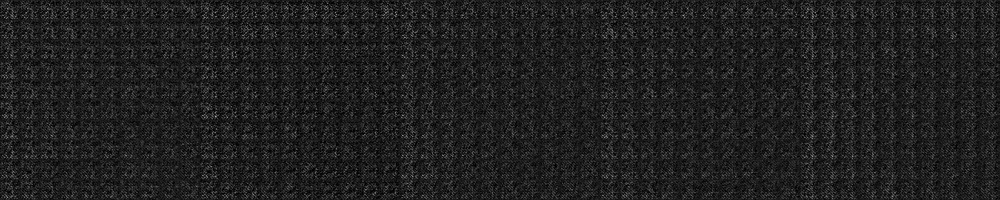

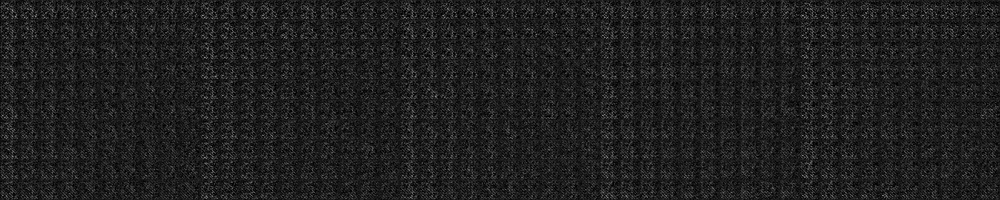

d_err 0.9581925868988037 0.9453125
qy_err 0.7714465856552124 1.0
g_err 1.0403162240982056 0.984375
qy_err 0.7673972249031067 1.0
qc_err -0.74586021900177 -0.7711259126663208
epoch= 1


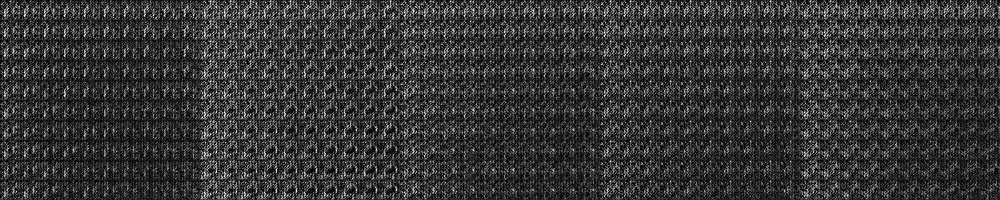

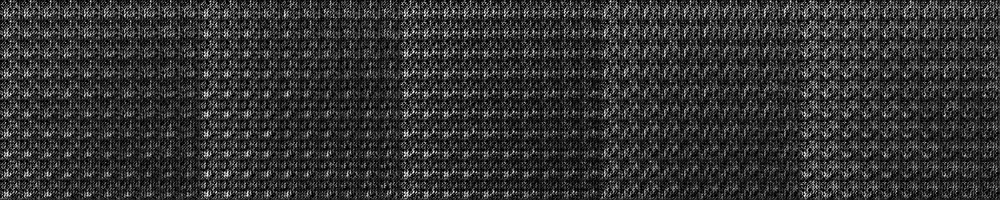

d_err 0.6591173410415649 0.98046875
qy_err 0.47620344161987305 1.0
g_err 1.4109435081481934 1.0
qy_err 0.4759746789932251 1.0
qc_err -1.2809302806854248 -1.2637287378311157
epoch= 2


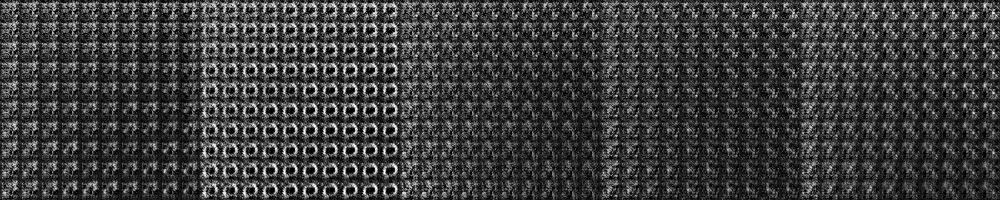

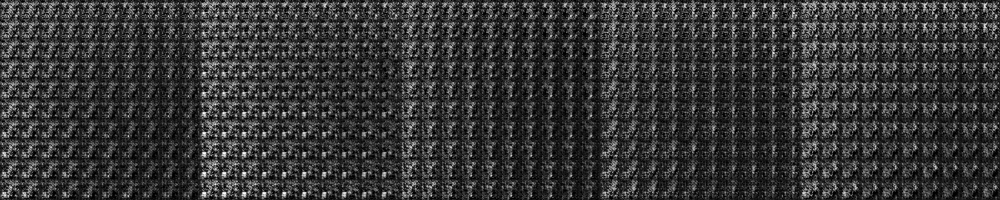

d_err 0.4510710537433624 1.0
qy_err 0.31583327054977417 1.0
g_err 1.6766115427017212 1.0
qy_err 0.28724750876426697 1.0
qc_err -1.5871129035949707 -1.3956658840179443
epoch= 3


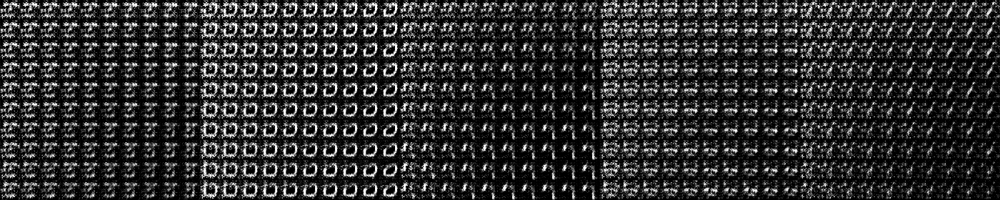

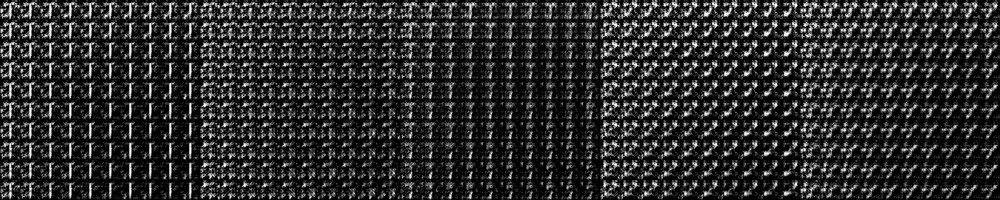

d_err 0.532013475894928 0.97265625
qy_err 0.21866852045059204 1.0
g_err 1.6302433013916016 1.0
qy_err 0.2154901623725891 1.0
qc_err -0.7976022362709045 -0.8608629703521729
epoch= 4


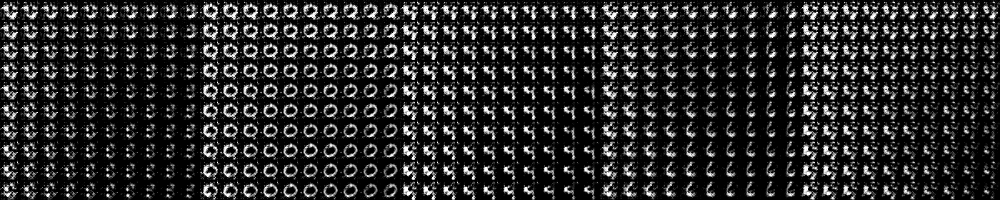

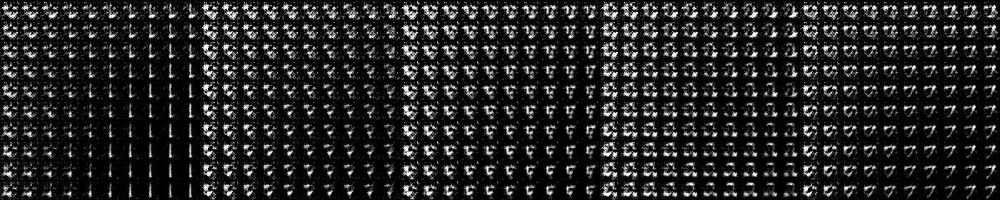

d_err 0.6516914963722229 0.9609375
qy_err 0.16042986512184143 1.0
g_err 1.5430878400802612 1.0
qy_err 0.157659649848938 1.0
qc_err -1.2824397087097168 -1.7316248416900635
epoch= 5


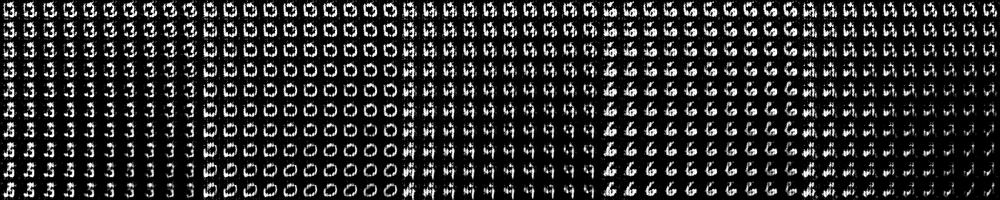

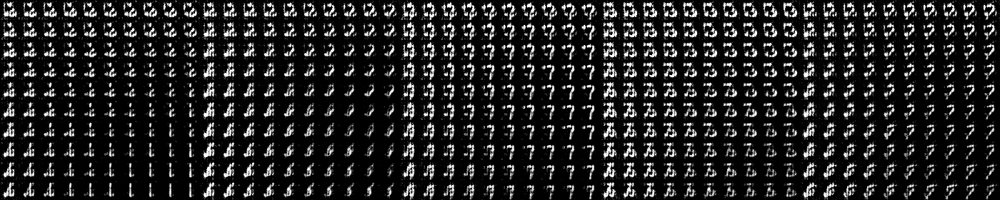

d_err 0.6089862585067749 0.96875
qy_err 0.15200914442539215 1.0
g_err 1.496781349182129 0.96875
qy_err 0.16978879272937775 1.0
qc_err -1.4053692817687988 -1.270944595336914
epoch= 6


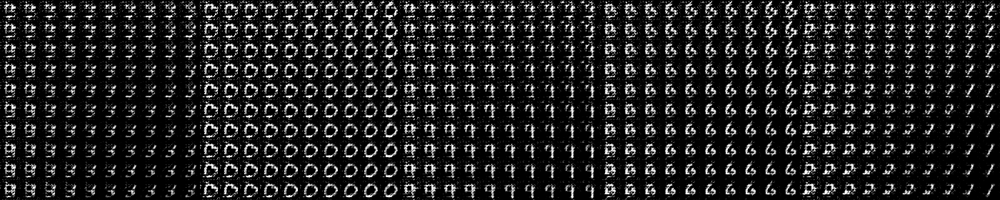

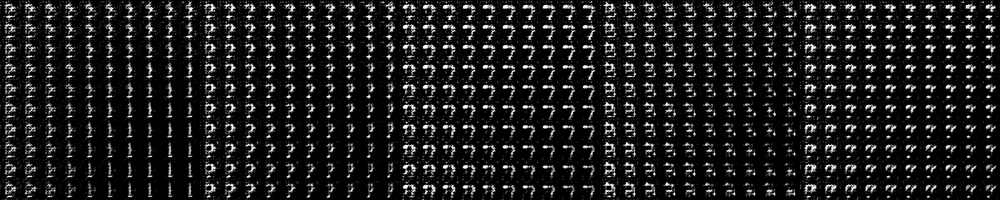

d_err 0.6149591207504272 0.95703125
qy_err 0.154652401804924 1.0
g_err 1.5224491357803345 0.984375
qy_err 0.15358966588974 1.0
qc_err -1.47231924533844 -1.4124326705932617
epoch= 7


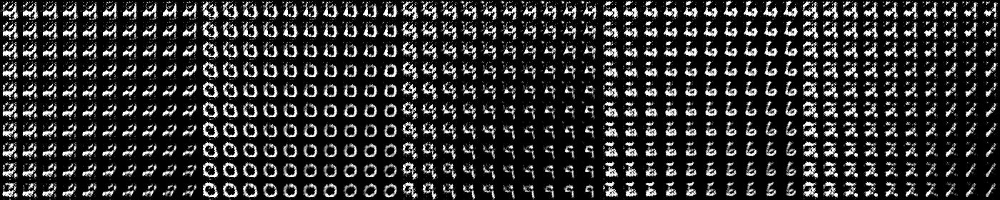

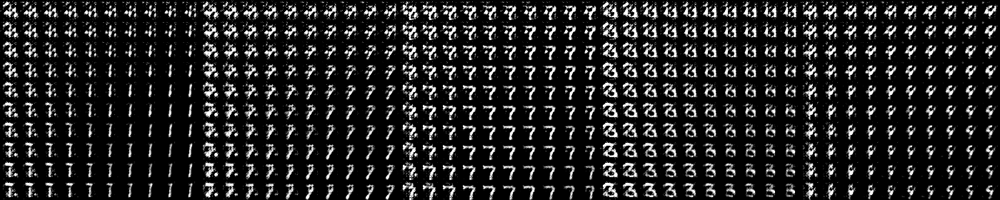

d_err 0.6587296724319458 0.94140625
qy_err 0.10395064949989319 1.0
g_err 1.5619008541107178 1.0
qy_err 0.09052817523479462 1.0
qc_err -1.8302366733551025 -1.8284804821014404
epoch= 8


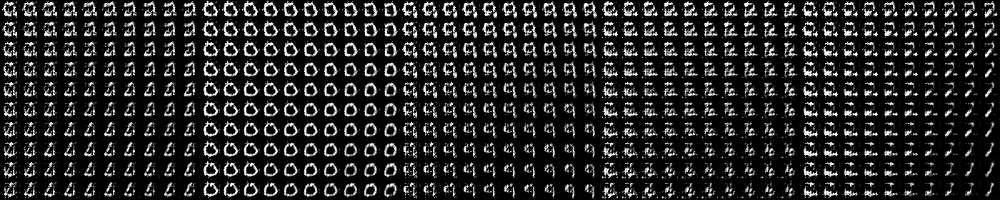

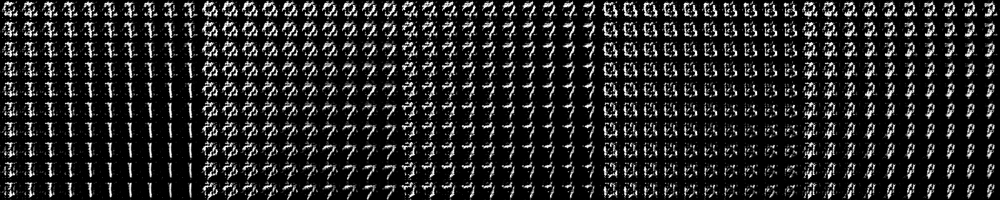

d_err 0.5444767475128174 0.97265625
qy_err 0.07768537104129791 1.0
g_err 1.766050100326538 1.0
qy_err 0.0660664439201355 1.0
qc_err -1.8456518650054932 -1.77135169506073
epoch= 9


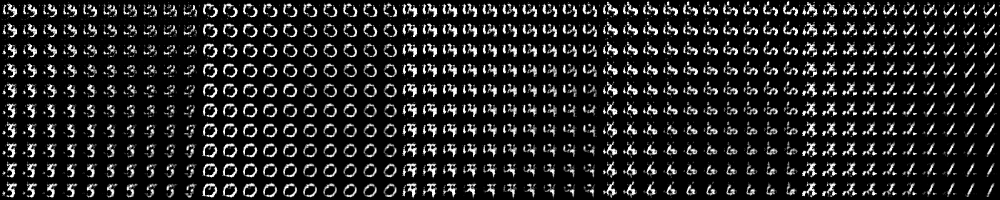

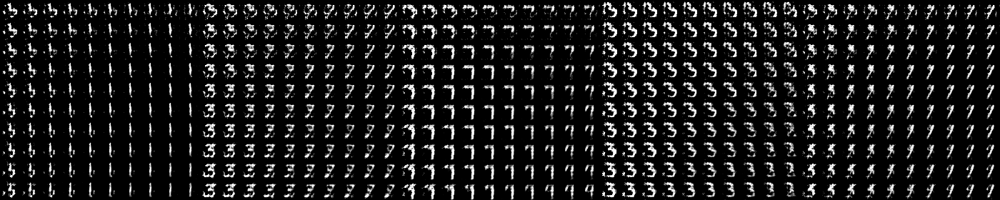

d_err 0.659307062625885 0.9140625
qy_err 0.06666749715805054 1.0
g_err 1.5748789310455322 0.953125
qy_err 0.08619692921638489 1.0
qc_err -1.8142316341400146 -1.7456934452056885
epoch= 10


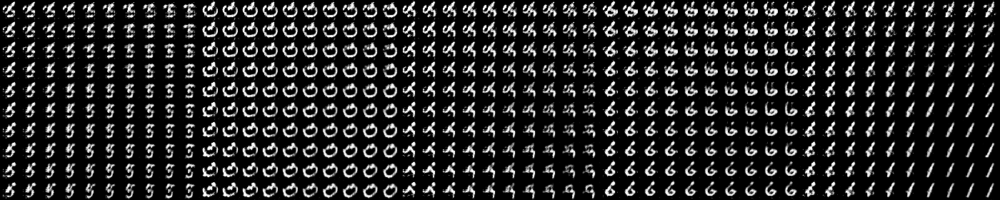

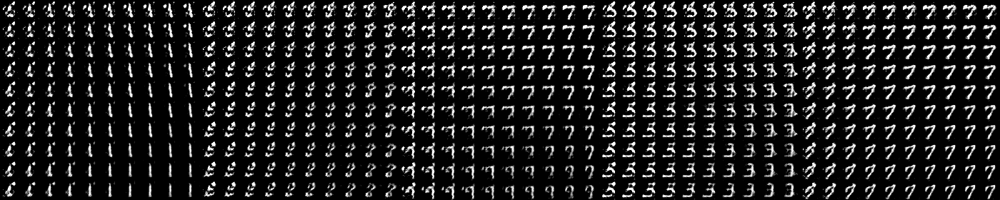

d_err 0.5695118308067322 0.94921875
qy_err 0.05876901373267174 1.0
g_err 1.6236032247543335 1.0
qy_err 0.07146541029214859 1.0
qc_err -1.8927785158157349 -1.7189180850982666
epoch= 11


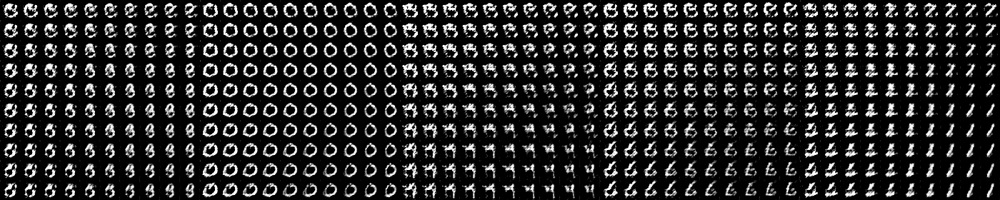

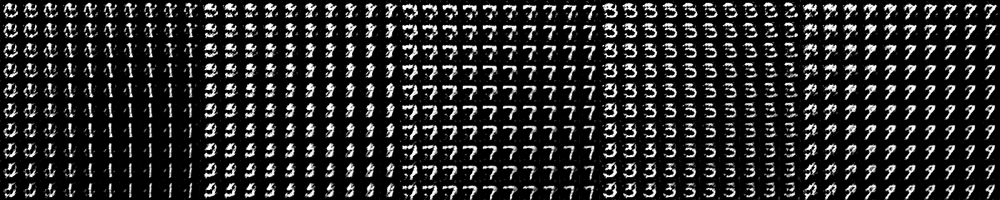

d_err 0.5903056859970093 0.97265625
qy_err 0.07156812399625778 0.9921875
g_err 1.5873043537139893 0.953125
qy_err 0.07025792449712753 1.0
qc_err -1.8534802198410034 -1.6042571067810059
epoch= 12


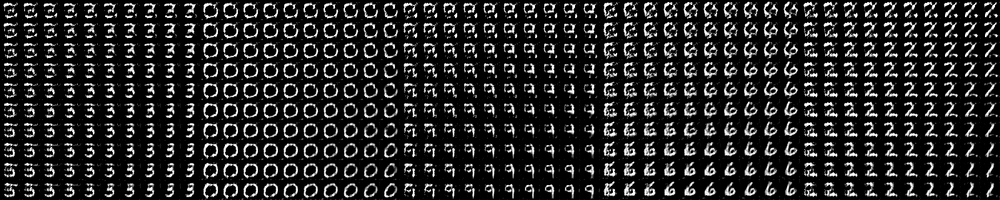

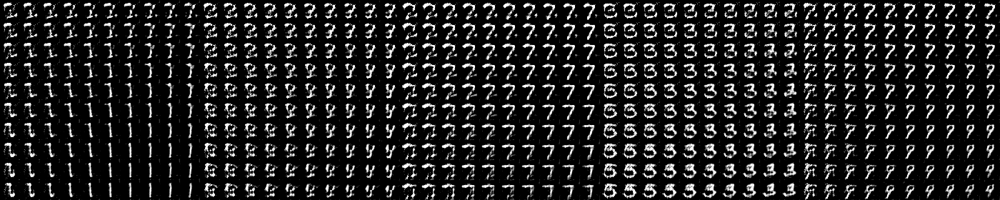

d_err 0.5874008536338806 0.953125
qy_err 0.06735096871852875 1.0
g_err 1.5709500312805176 0.9921875
qy_err 0.049739107489585876 1.0
qc_err -1.2075139284133911 -1.8086059093475342
epoch= 13


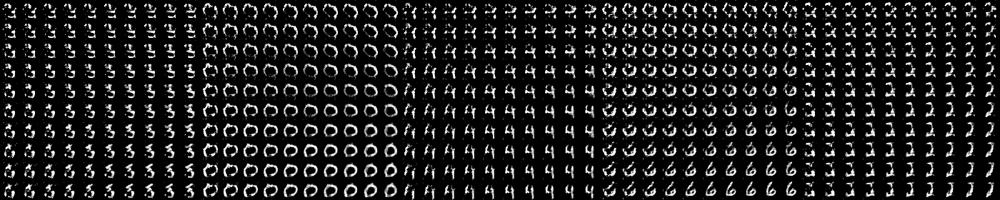

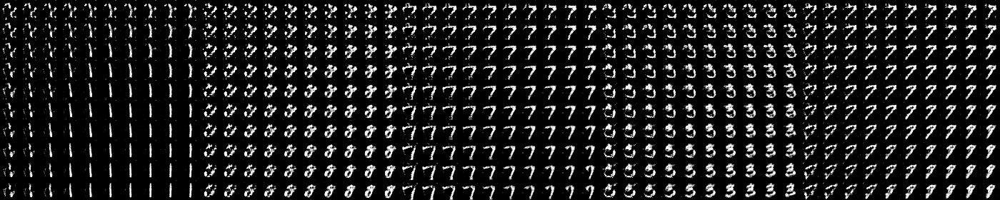

d_err 0.6760202646255493 0.94921875
qy_err 0.04104297235608101 1.0
g_err 1.598329782485962 0.984375
qy_err 0.04040450602769852 1.0
qc_err -1.8468011617660522 -2.0468173027038574
epoch= 14


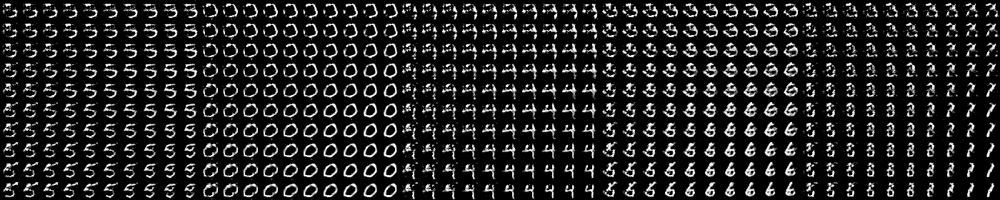

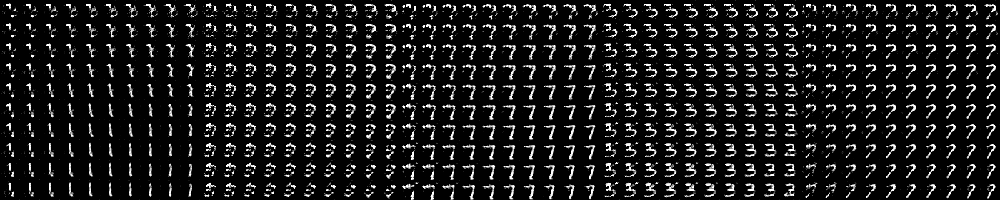

d_err 0.6769511103630066 0.921875
qy_err 0.049746397882699966 1.0
g_err 1.5994517803192139 0.96875
qy_err 0.03237035870552063 1.0
qc_err -1.758655309677124 -1.6426653861999512
epoch= 15


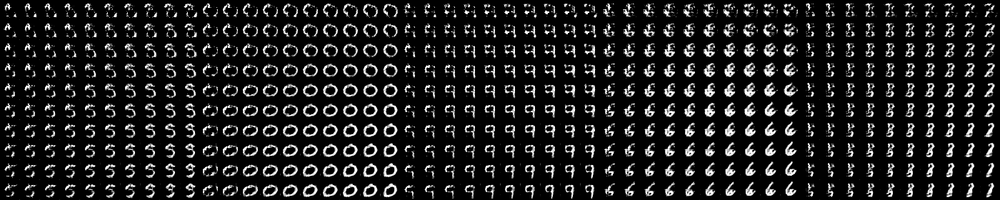

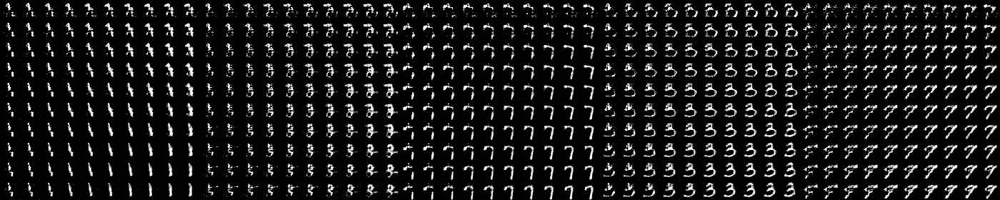

d_err 0.6410059928894043 0.9375
qy_err 0.046104758977890015 1.0
g_err 1.6494728326797485 0.953125
qy_err 0.03691064566373825 1.0
qc_err -1.9902818202972412 -1.9068846702575684
epoch= 16


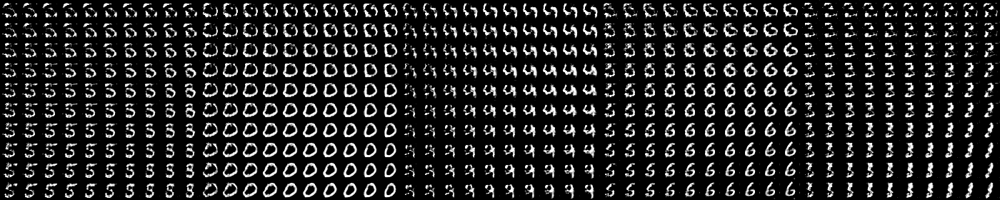

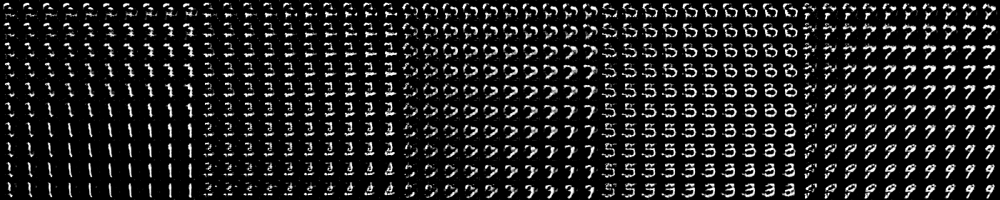

d_err 0.637346625328064 0.9296875
qy_err 0.0345243401825428 1.0
g_err 1.7124308347702026 0.96875
qy_err 0.07623600214719772 0.9765625
qc_err -1.812251329421997 -1.7635051012039185
epoch= 17


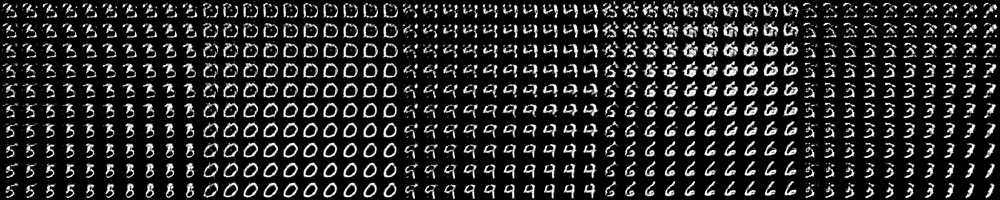

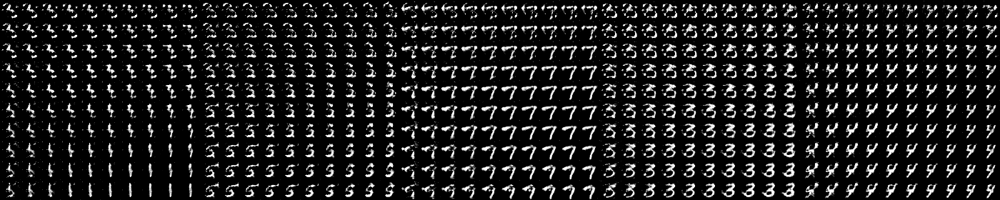

d_err 0.6847133636474609 0.91796875
qy_err 0.042052797973155975 1.0
g_err 1.694767951965332 0.984375
qy_err 0.030306480824947357 1.0
qc_err -1.9158742427825928 -1.901430368423462
epoch= 18


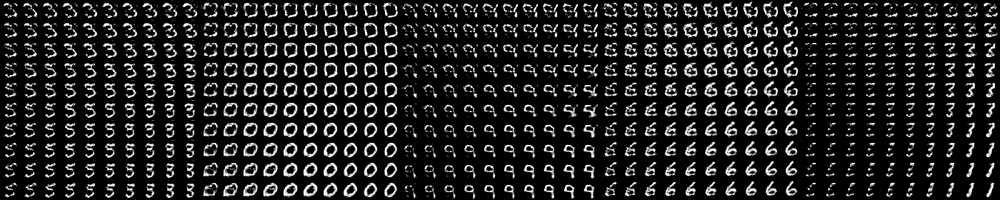

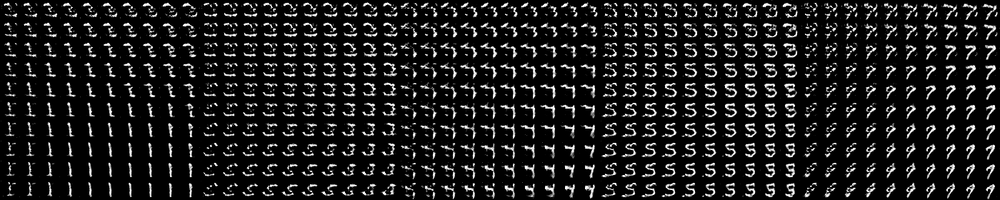

d_err 0.6058746576309204 0.9296875
qy_err 0.03483166918158531 1.0
g_err 1.5499475002288818 0.9609375
qy_err 0.051661375910043716 0.9921875
qc_err -1.8591830730438232 -1.8234469890594482
epoch= 19


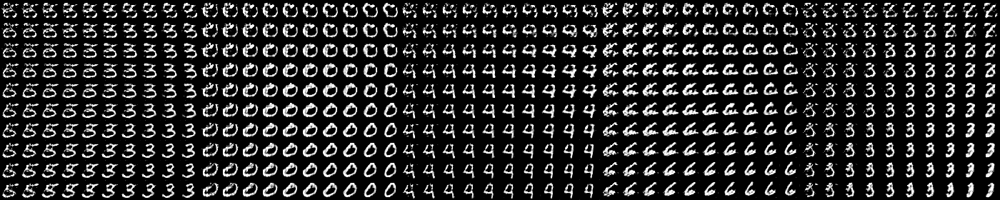

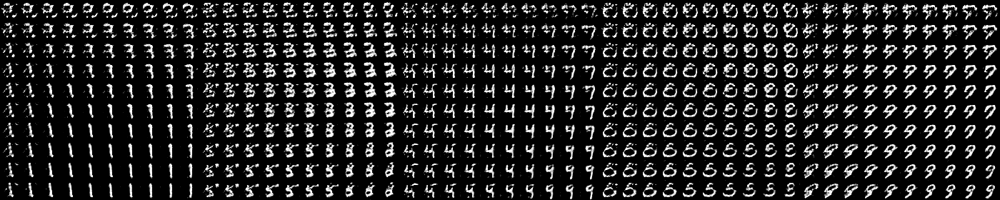

d_err 0.719146728515625 0.8828125
qy_err 0.03097231313586235 1.0
g_err 1.6242358684539795 0.9765625
qy_err 0.027940457686781883 1.0
qc_err -1.9143173694610596 -1.7329039573669434
epoch= 20


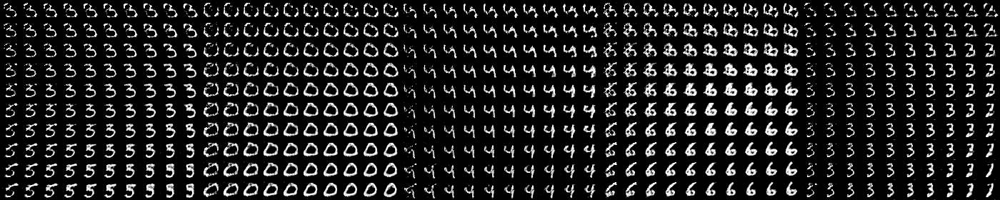

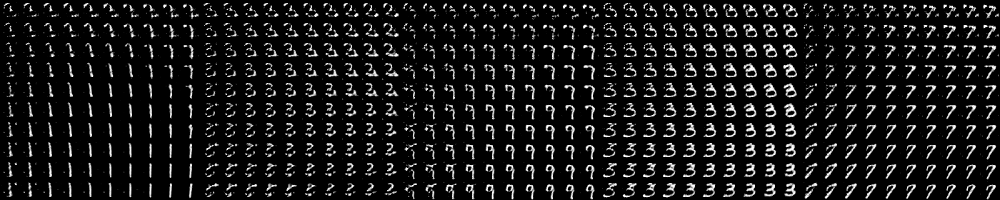

d_err 0.7068006992340088 0.8984375
qy_err 0.03823155537247658 1.0
g_err 1.4083365201950073 0.9375
qy_err 0.029911598190665245 1.0
qc_err -1.8602474927902222 -1.7309458255767822
epoch= 21


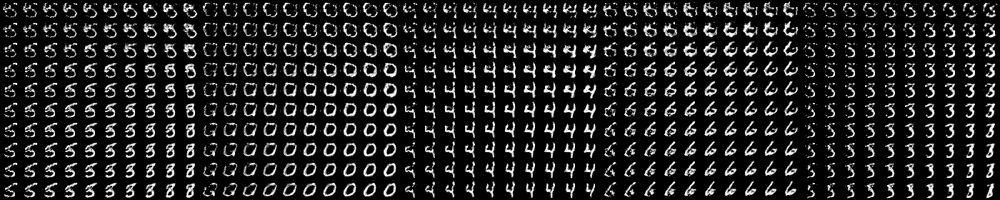

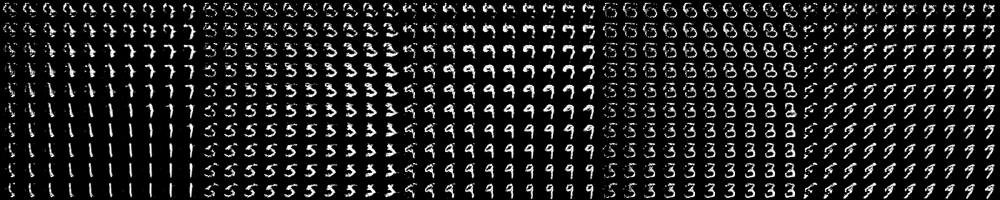

d_err 0.6004401445388794 0.953125
qy_err 0.02374696172773838 1.0
g_err 1.65831458568573 0.9609375
qy_err 0.030951201915740967 1.0
qc_err -2.0199663639068604 -2.008796215057373
epoch= 22


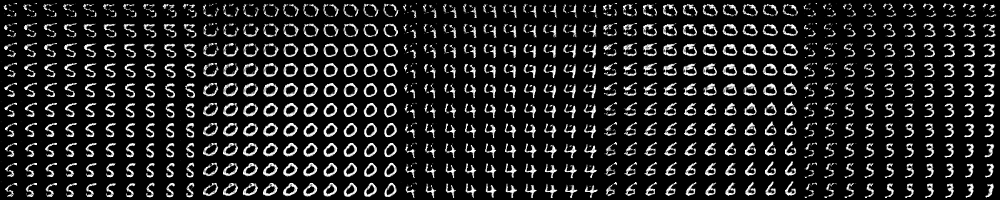

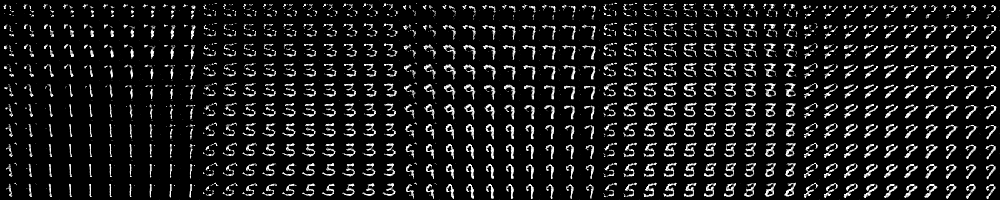

d_err 0.7094929218292236 0.88671875
qy_err 0.021888865157961845 1.0
g_err 1.4575530290603638 0.9453125
qy_err 0.020854420959949493 1.0
qc_err -2.1040430068969727 -2.0912885665893555
epoch= 23


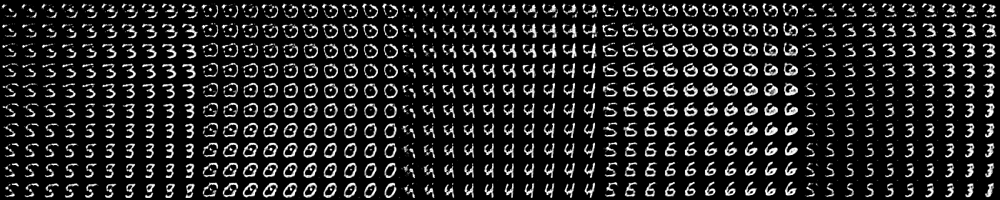

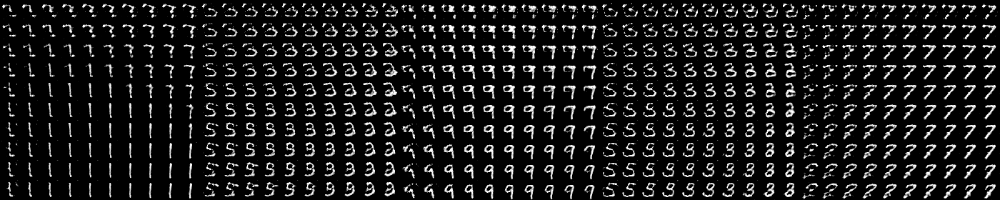

d_err 0.548725962638855 0.96875
qy_err 0.049613699316978455 0.9921875
g_err 1.6539970636367798 0.96875
qy_err 0.02440415322780609 1.0
qc_err -2.0743255615234375 -2.0395147800445557
epoch= 24


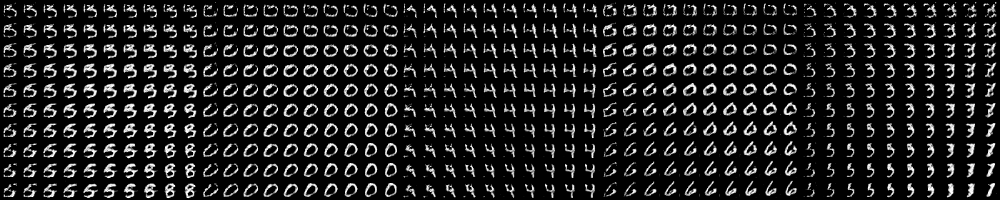

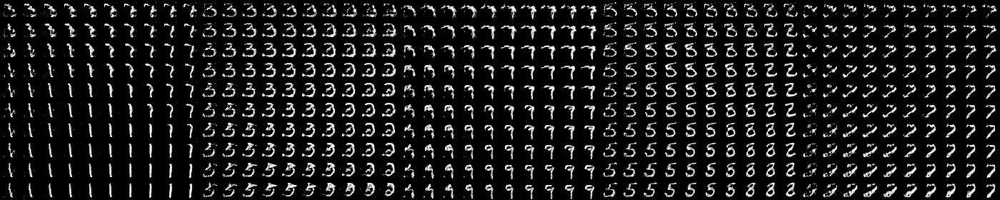

d_err 0.6236863136291504 0.8984375
qy_err 0.029950235038995743 1.0
g_err 1.7100783586502075 0.9765625
qy_err 0.01499760802835226 1.0
qc_err -1.8361926078796387 -1.8351415395736694
epoch= 25


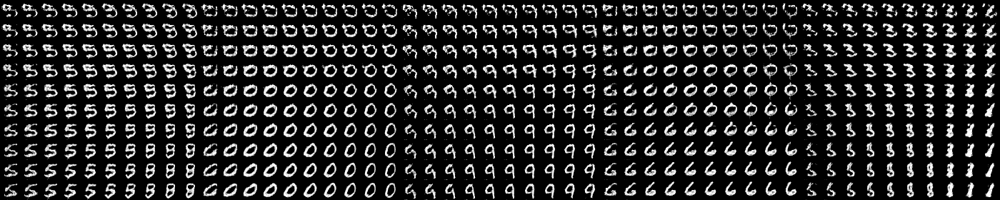

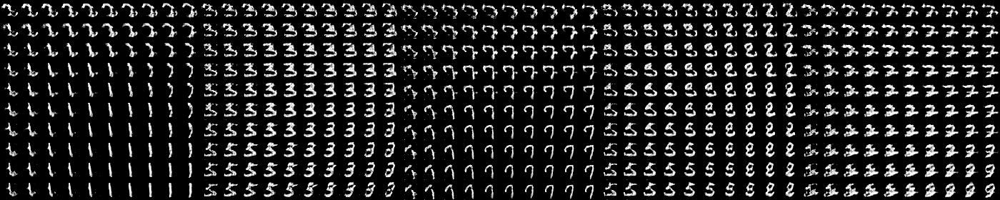

d_err 0.576587975025177 0.91015625
qy_err 0.027596529573202133 1.0
g_err 1.653547763824463 0.9609375
qy_err 0.0300399549305439 1.0
qc_err -1.4292200803756714 -2.11460542678833
epoch= 26


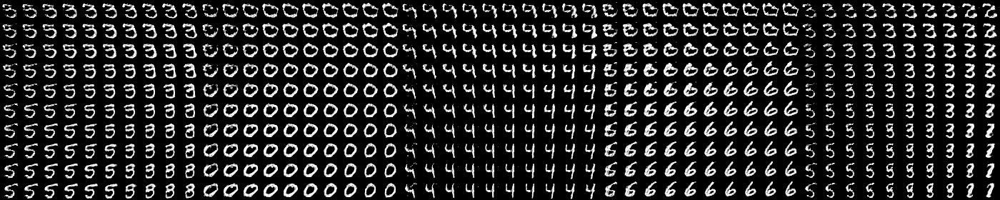

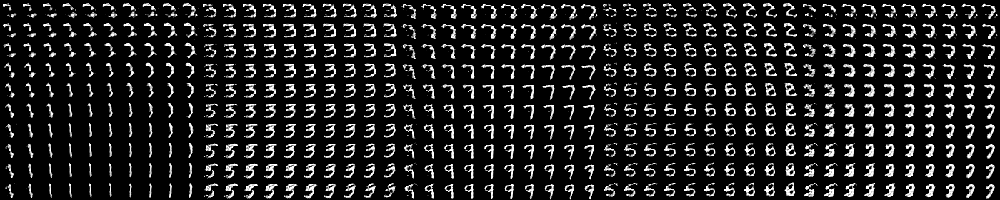

d_err 0.855259120464325 0.78125
qy_err 0.016082897782325745 1.0
g_err 1.8207273483276367 0.765625
qy_err 0.018567347899079323 1.0
qc_err -1.9411641359329224 -2.0007870197296143
epoch= 27


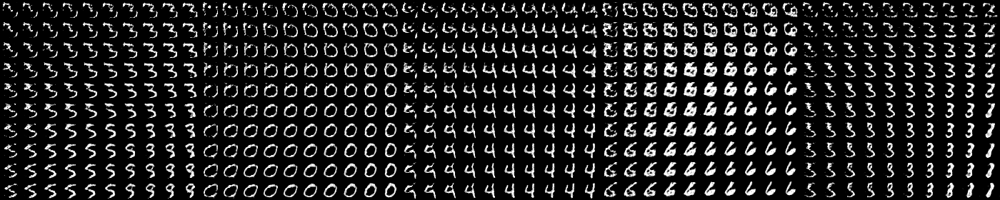

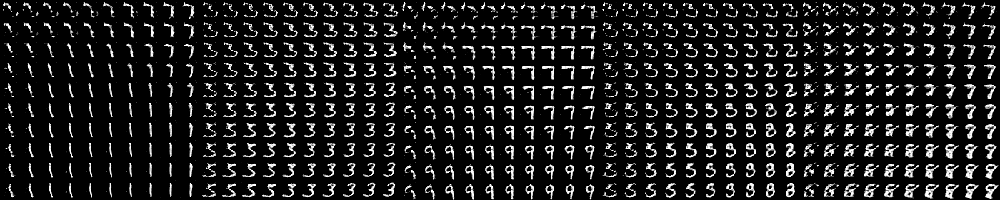

d_err 0.5906020998954773 0.95703125
qy_err 0.04573889821767807 0.9921875
g_err 1.8302538394927979 0.96875
qy_err 0.027816537767648697 0.9921875
qc_err -2.041231155395508 -1.855668067932129
epoch= 28


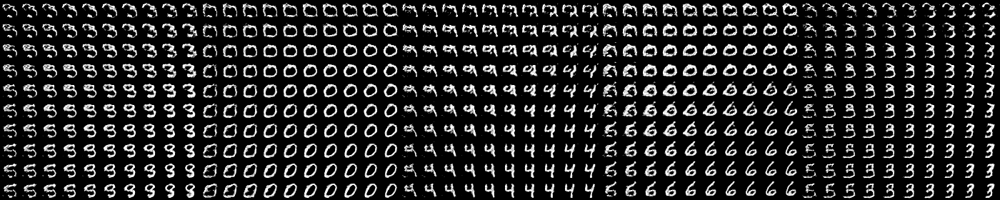

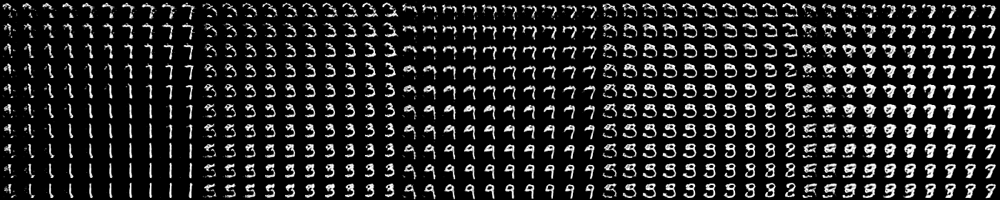

d_err 0.6407270431518555 0.89453125
qy_err 0.015545185655355453 1.0
g_err 1.4740700721740723 0.90625
qy_err 0.018237387761473656 1.0
qc_err -1.316819190979004 -1.3520702123641968
epoch= 29


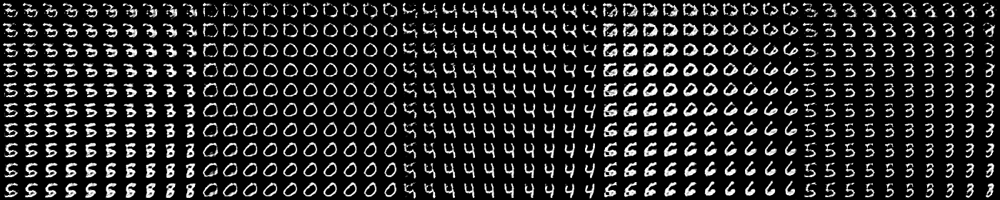

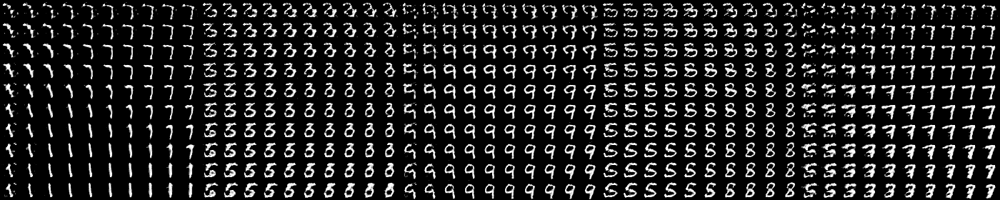

d_err 0.6512090563774109 0.8984375
qy_err 0.015521150082349777 1.0
g_err 1.7562777996063232 0.9375
qy_err 0.051212526857852936 0.984375
qc_err -2.0918264389038086 -1.9661805629730225
epoch= 30


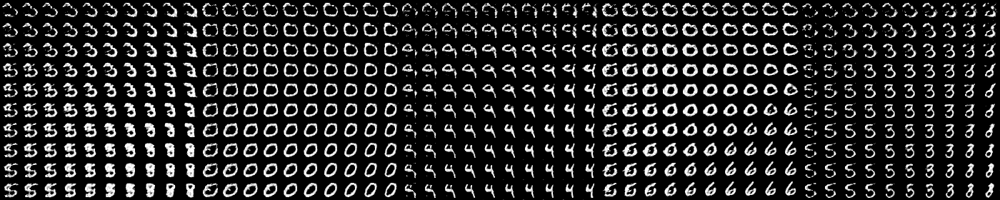

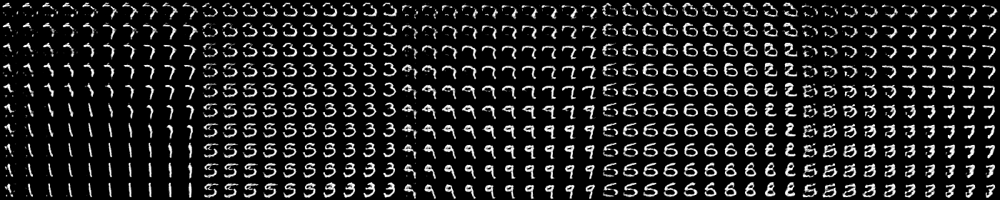

d_err 0.6915752291679382 0.8828125
qy_err 0.01798102632164955 1.0
g_err 1.6903940439224243 0.8828125
qy_err 0.01405604649335146 1.0
qc_err -2.0362257957458496 -1.7044093608856201
epoch= 31


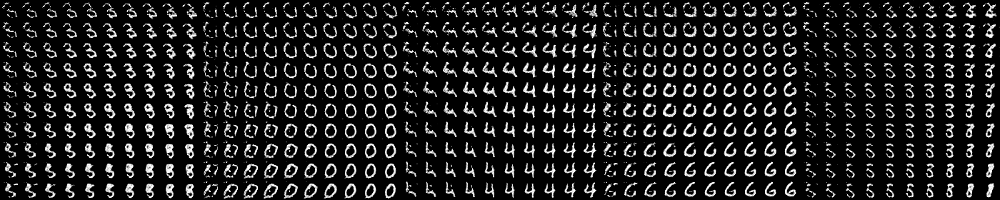

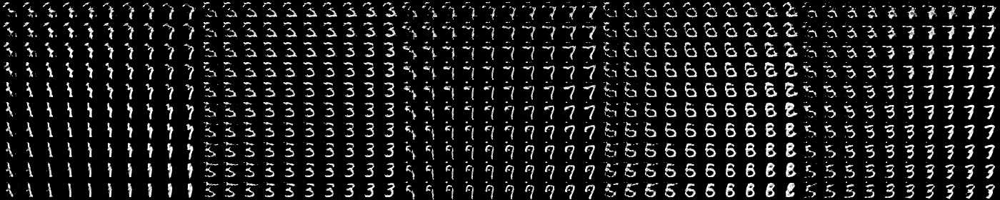

d_err 0.58901047706604 0.92578125
qy_err 0.026622798293828964 1.0
g_err 2.2563705444335938 0.9921875
qy_err 0.021807760000228882 1.0
qc_err -1.8945039510726929 -1.9934935569763184
epoch= 32


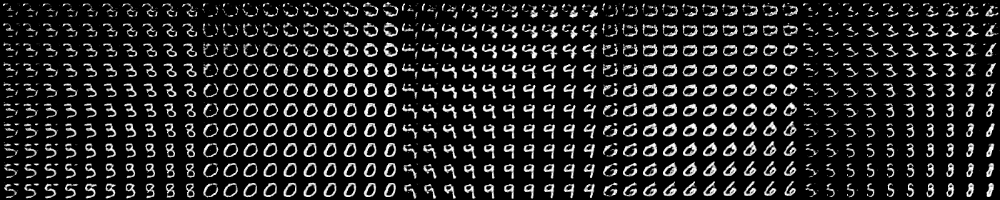

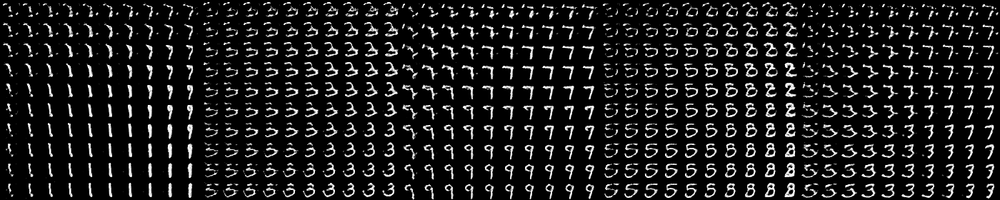

d_err 0.68632972240448 0.87109375
qy_err 0.017917834222316742 0.9921875
g_err 1.62153959274292 0.9296875
qy_err 0.02897244319319725 1.0
qc_err -1.9362516403198242 -1.9577953815460205
epoch= 33


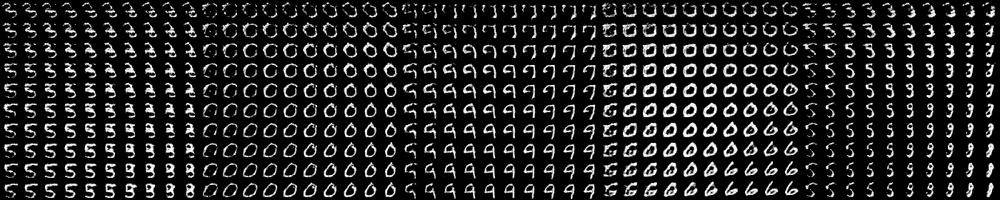

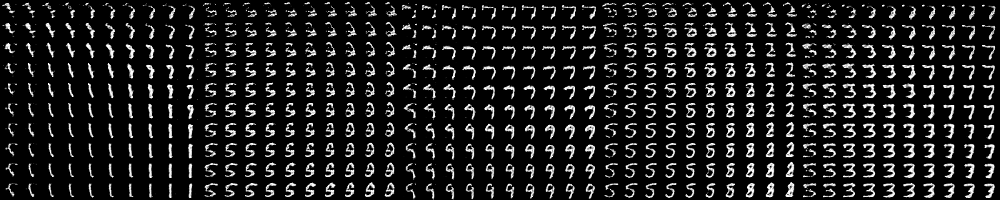

d_err 0.6770527362823486 0.87109375
qy_err 0.014468904584646225 1.0
g_err 1.5155770778656006 0.9375
qy_err 0.018785178661346436 1.0
qc_err -2.111097812652588 -1.6995471715927124
epoch= 34


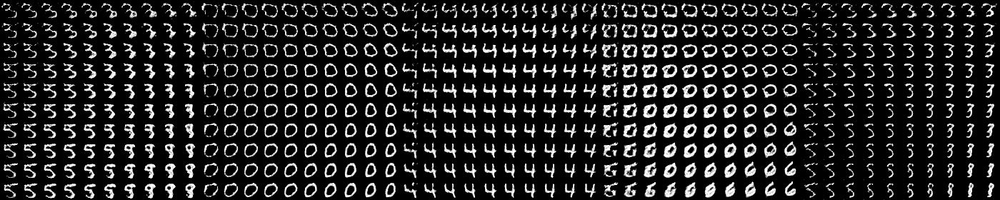

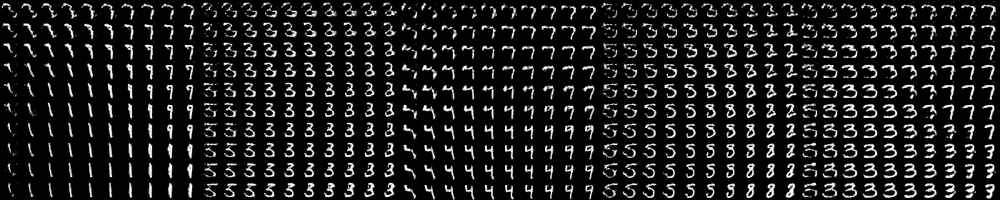

d_err 0.6238699555397034 0.9140625
qy_err 0.030774658545851707 1.0
g_err 1.4010425806045532 0.890625
qy_err 0.03864147886633873 0.984375
qc_err -2.0854544639587402 -1.8337572813034058
epoch= 35


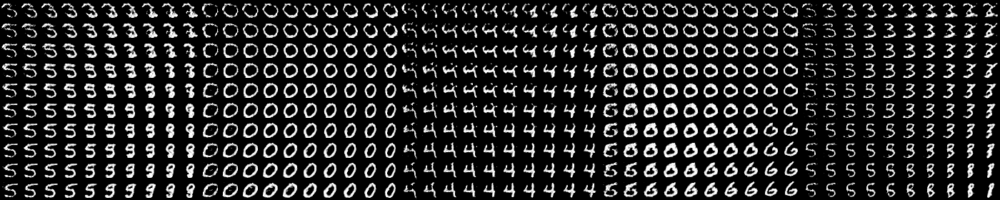

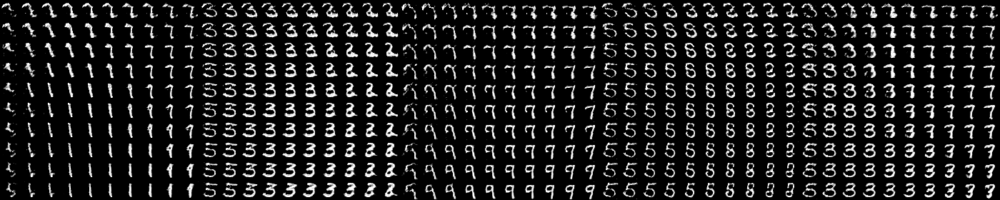

d_err 0.6580585241317749 0.890625
qy_err 0.029966767877340317 1.0
g_err 1.6021243333816528 0.890625
qy_err 0.018435083329677582 1.0
qc_err -2.0463292598724365 -2.0881776809692383
epoch= 36


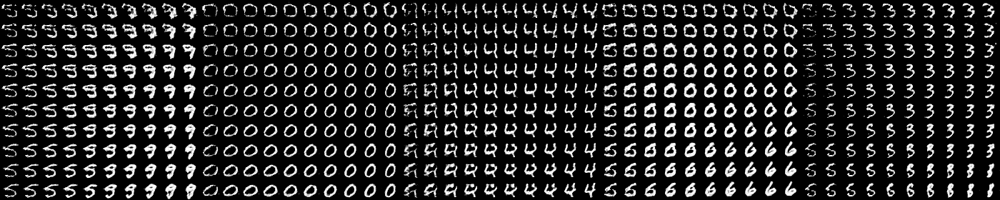

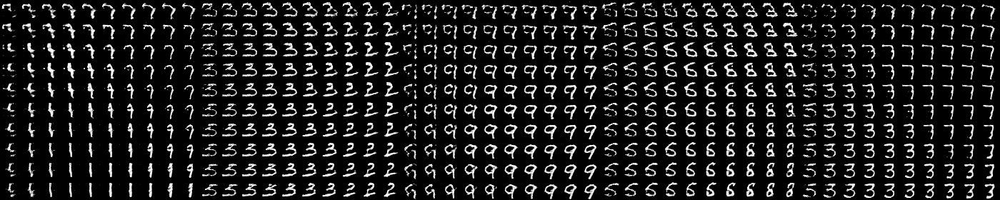

d_err 0.5751107931137085 0.9296875
qy_err 0.021969955414533615 1.0
g_err 1.76422917842865 0.953125
qy_err 0.025477398186922073 1.0
qc_err -2.0134594440460205 -2.0611915588378906
epoch= 37


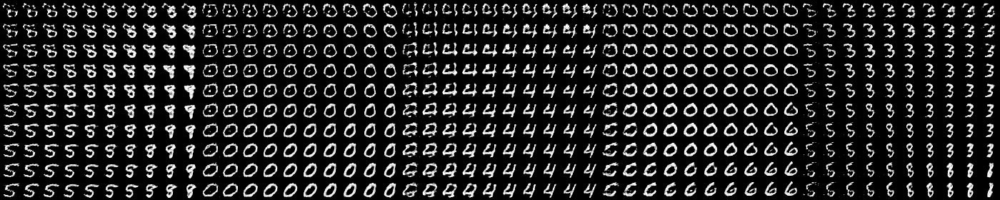

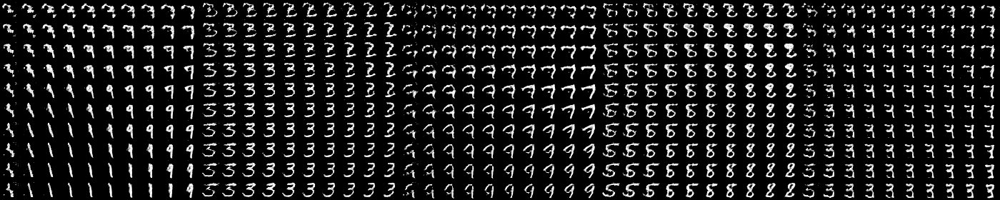

d_err 0.7022409439086914 0.87109375
qy_err 0.014113161712884903 1.0
g_err 1.5536754131317139 0.8984375
qy_err 0.022208843380212784 1.0
qc_err -2.1145920753479004 -1.6335116624832153
epoch= 38


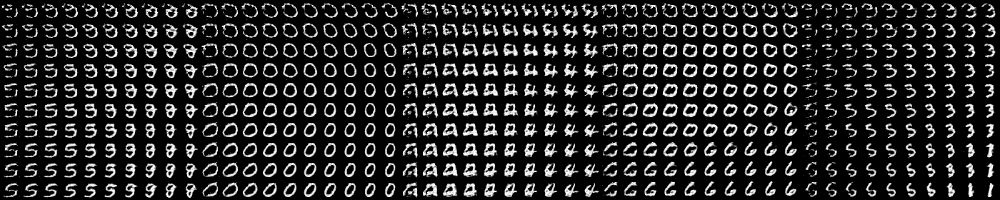

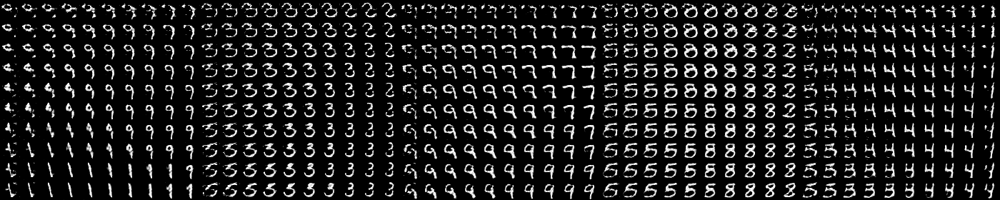

d_err 0.5150287747383118 0.9375
qy_err 0.017419658601284027 1.0
g_err 1.8562337160110474 0.984375
qy_err 0.02057567983865738 1.0
qc_err -1.9178988933563232 -1.8991327285766602
epoch= 39


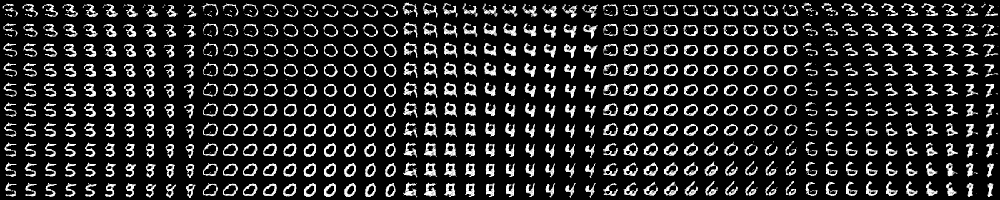

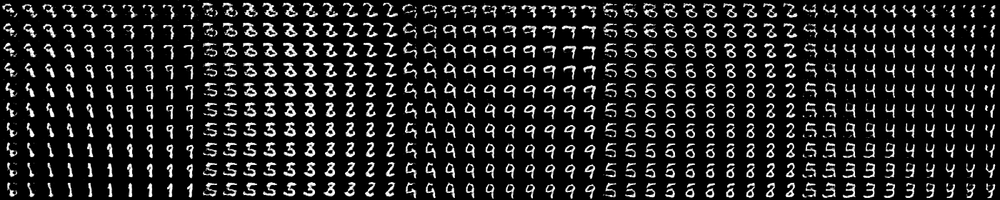

d_err 0.5830275416374207 0.91796875
qy_err 0.012090913951396942 1.0
g_err 2.2477941513061523 0.984375
qy_err 0.021937496960163116 1.0
qc_err -2.2008142471313477 -1.8549741506576538
epoch= 40


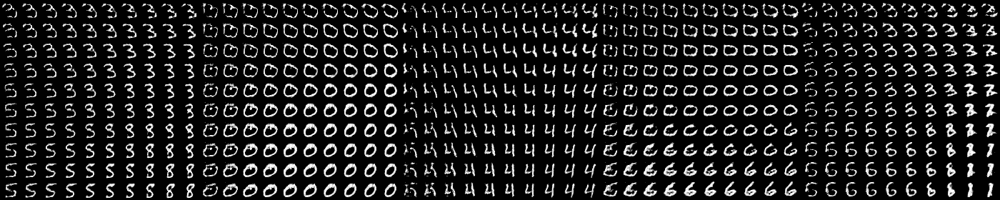

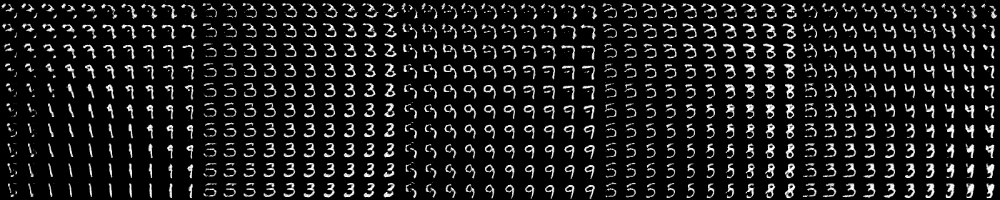

d_err 0.5929175615310669 0.90234375
qy_err 0.0240427665412426 1.0
g_err 1.9516692161560059 0.9296875
qy_err 0.029299622401595116 1.0
qc_err -1.82285737991333 -2.1120307445526123
epoch= 41


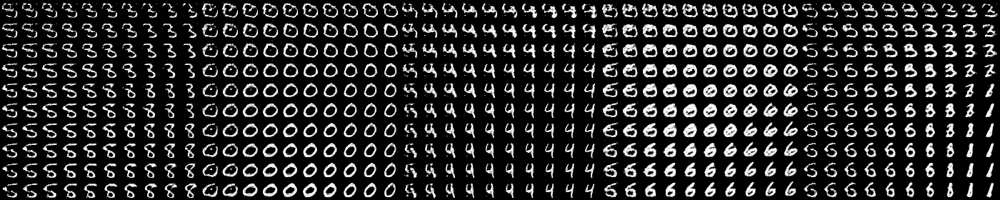

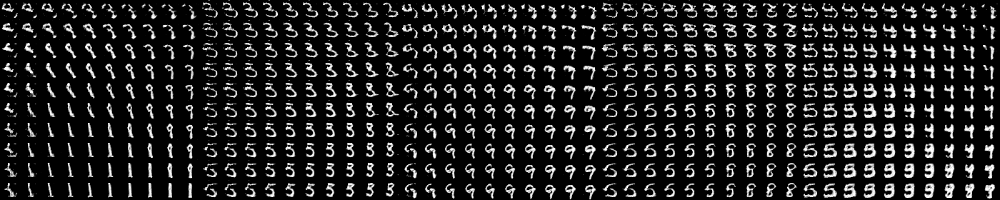

d_err 0.7115083932876587 0.87890625
qy_err 0.018046483397483826 1.0
g_err 2.1234898567199707 0.90625
qy_err 0.017424577847123146 1.0
qc_err -2.1969752311706543 -2.087981939315796
epoch= 42


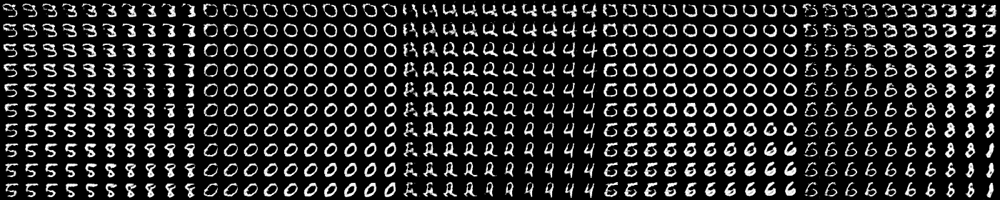

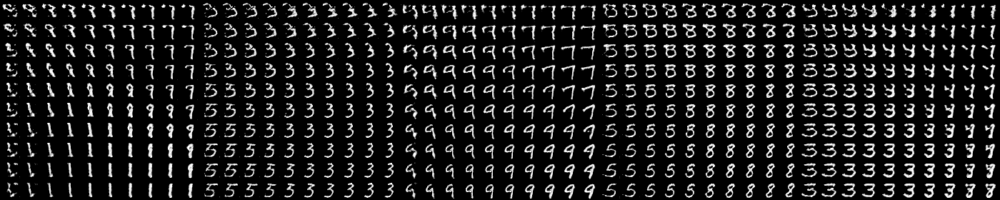

d_err 0.5508387684822083 0.9296875
qy_err 0.013856640085577965 1.0
g_err 1.8059985637664795 0.9453125
qy_err 0.04572839289903641 0.9765625
qc_err -1.481996774673462 -2.1303250789642334
epoch= 43


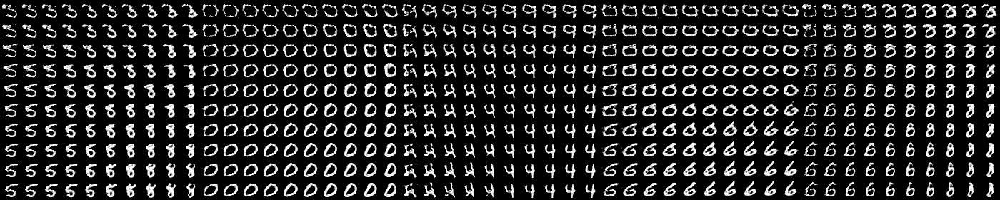

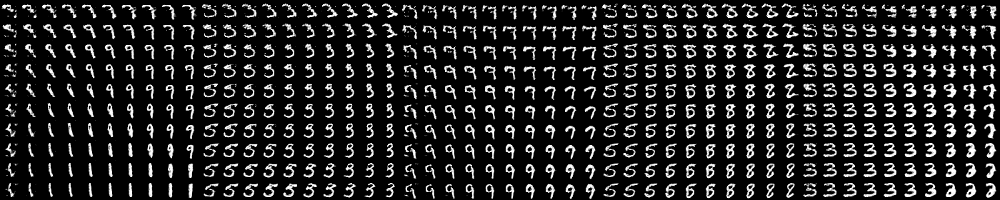

d_err 0.7307471036911011 0.86328125
qy_err 0.01473760511726141 1.0
g_err 2.138762950897217 0.90625
qy_err 0.018091794103384018 1.0
qc_err -1.563979148864746 -1.850588321685791
epoch= 44


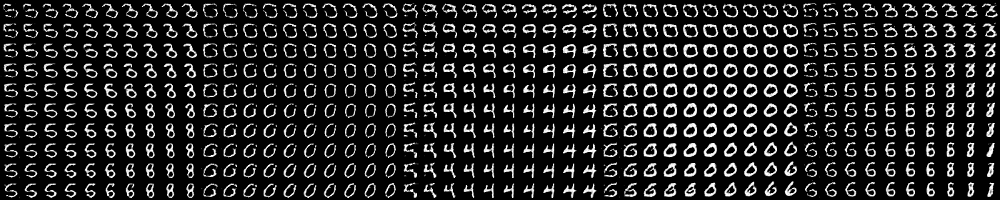

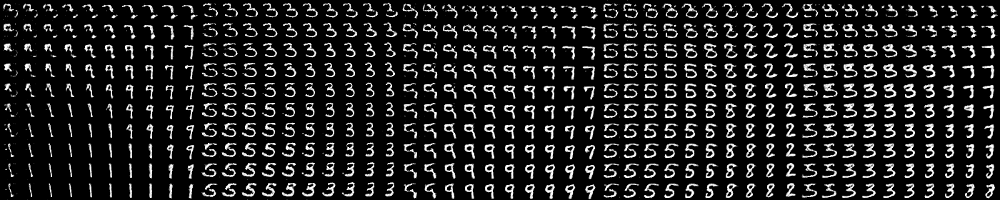

d_err 0.4996088743209839 0.953125
qy_err 0.014515237882733345 1.0
g_err 1.8760883808135986 0.96875
qy_err 0.008595416322350502 1.0
qc_err -2.237776756286621 -1.9890670776367188
epoch= 45


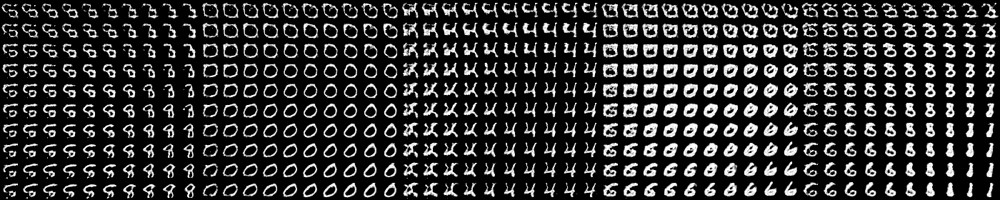

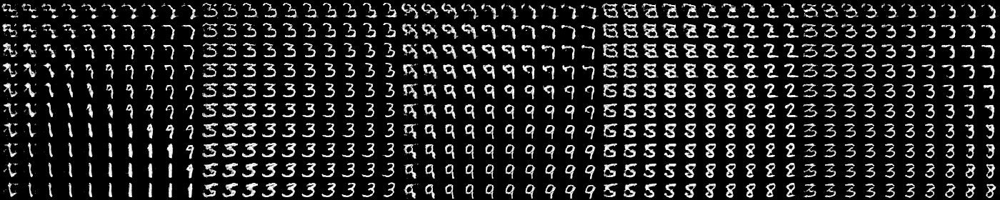

d_err 0.6685642004013062 0.8828125
qy_err 0.017605366185307503 1.0
g_err 1.6273839473724365 0.9375
qy_err 0.009860940277576447 1.0
qc_err -2.1792445182800293 -1.9597995281219482
epoch= 46


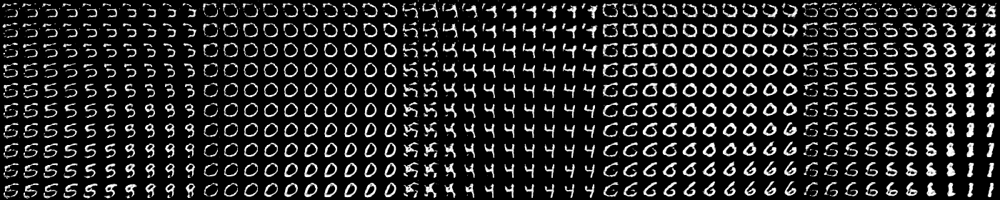

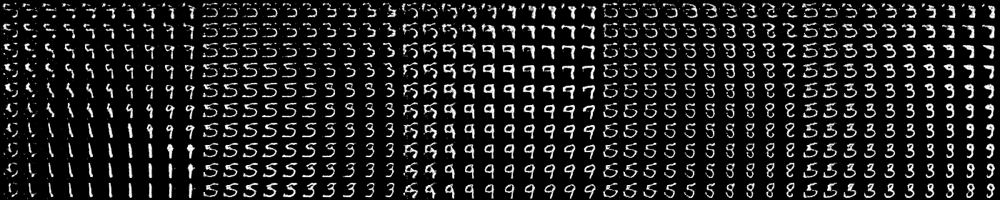

d_err 0.5553697347640991 0.9375
qy_err 0.01902688667178154 1.0
g_err 2.0018062591552734 0.9765625
qy_err 0.014614420011639595 1.0
qc_err -2.0574147701263428 -2.2291972637176514
epoch= 47


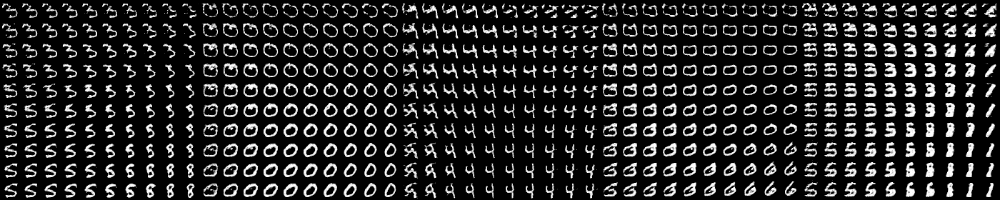

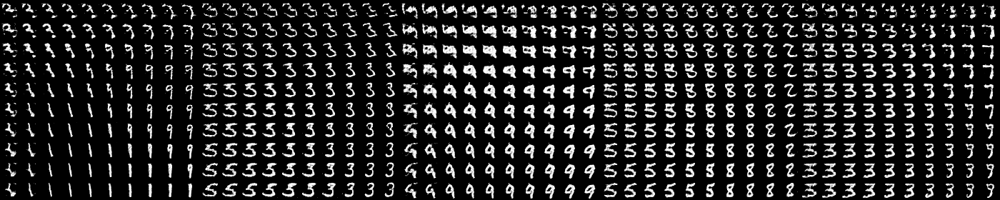

d_err 0.5722688436508179 0.91796875
qy_err 0.01864231377840042 1.0
g_err 1.5151419639587402 0.8046875
qy_err 0.02409544587135315 1.0
qc_err -2.0138862133026123 -2.000732898712158
epoch= 48


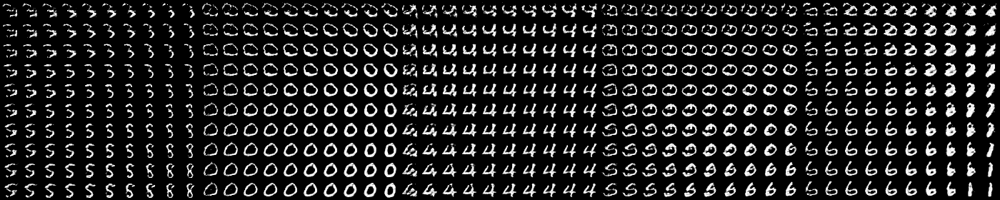

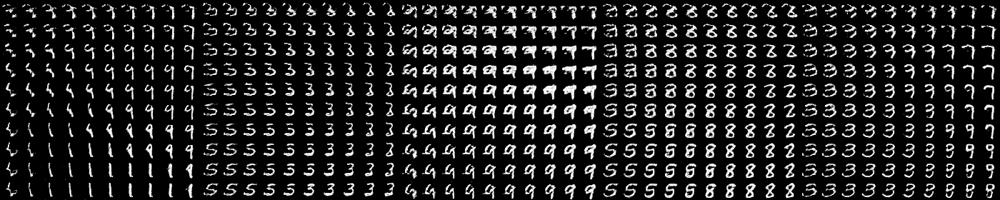

d_err 0.45489227771759033 0.9453125
qy_err 0.024860620498657227 0.9921875
g_err 1.8897329568862915 0.96875
qy_err 0.014862114563584328 1.0
qc_err -2.0762925148010254 -1.7284719944000244
epoch= 49


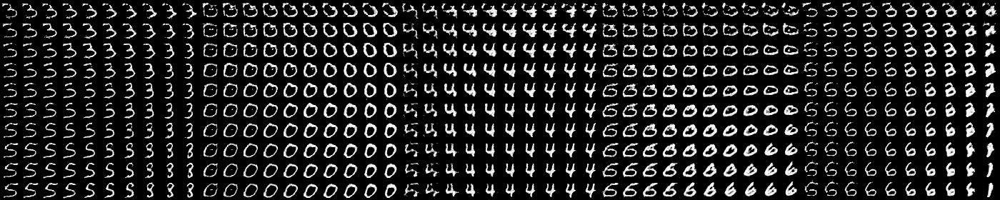

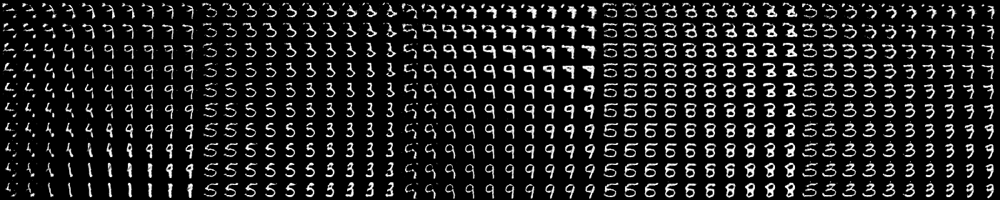

d_err 0.5316696763038635 0.90234375
qy_err 0.012908168137073517 1.0
g_err 2.425332546234131 1.0
qy_err 0.012061423622071743 1.0
qc_err -1.867767095565796 -2.117500066757202


In [21]:
for epoch in range(50):
    for j in range(100):
        d_err, qy_err, qc_err, d_acc, qy_acc = train_discriminator_fn(sample_X(), sample_Y(), sample_C(), sample_Z())         
        g_err, qy_err2, qc_err2, g_acc, qy_acc2 = train_generator_fn(sample_Y(), sample_C(), sample_Z())    
    printx("epoch=", epoch)
    show_result(10)
    printx("d_err", d_err, d_acc)
    printx("qy_err", qy_err, qy_acc)
    printx("g_err", g_err, g_acc)
    printx("qy_err", qy_err2, qy_acc2)
    printx("qc_err", qc_err, qc_err2)

In [22]:
Y=np.zeros((100,10),dtype='float32')        
Y[arange(100), arange(100)//10]=1
C=np.array([ [0.1+0.08*(i%10)]*2 for i in range(100)], dtype='float32')
imgs = generator_fn(Y, C, sample_Z(100))
for i in range(0, 100, 10):
    show(imgs[i:i+10])

In [23]:
#np.savez('cifar10_gan_classifier_generator.npz', lasagne.layers.get_all_param_values(l_generator))
#np.savez('cifar10_gan_classifier_discriminator.npz', lasagne.layers.get_all_param_values(l_discriminator))
#np.savez('cifar10_gan_classifier_classifier.npz', lasagne.layers.get_all_param_values(l_classifier))


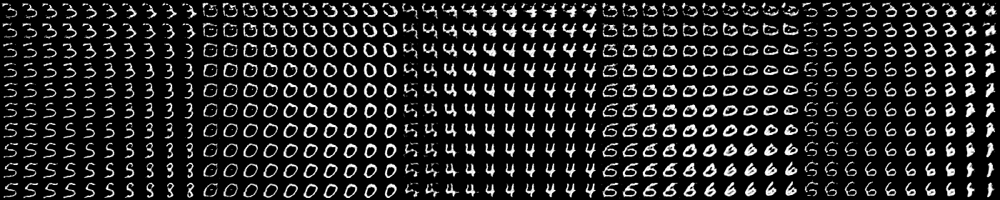

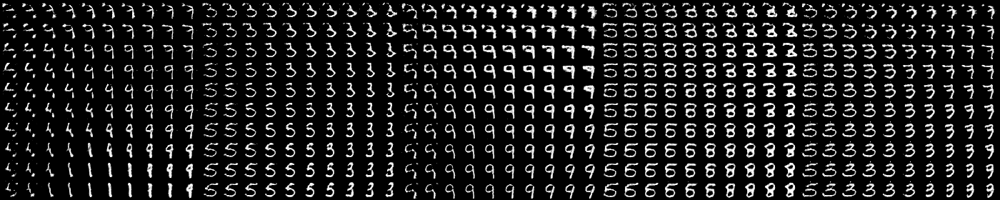

In [24]:
show_result(10)